In [1]:
import nibabel as nib
import os
import numpy as np
from nilearn import image
from nilearn import plotting
from nilearn import datasets


In [2]:
# visualize the data
datpath = '../shared/ds000030_R1.0.5/uncompressed/derivatives/fmriprep/'
subfolder = 'sub-10171'
task_list = ['bart','bht','scap','stopsignal'] # we need 4 tasks
task = task_list[1]
filename = subfolder + '_task-' + task + '_bold_space-MNI152NLin2009cAsym_preproc.nii.gz'
full_path = os.path.join(datpath, subfolder, 'func',filename)

img = nib.load(full_path)
img.shape
img_1 = image.index_img(img,1)

In [3]:
img.shape

(65, 77, 49, 80)

In [9]:
# define confounds
import pandas as pd
confound_name = subfolder + '_task-' + task + '_bold_confounds.tsv'
confound_path = os.path.join(datpath, subfolder, 'func',confound_name)
confound_df = pd.read_csv(confound_path, sep='\t')

In [12]:
confound_df.head() 

,WhiteMatter,GlobalSignal,stdDVARS,non-stdDVARS,vx-wisestdDVARS,FramewiseDisplacement,tCompCor00,tCompCor01,tCompCor02,tCompCor03,...,aCompCor02,aCompCor03,aCompCor04,aCompCor05,X,Y,Z,RotX,RotY,RotZ
0,-0.751393,1.493822,NaN,NaN,NaN,NaN,-0.060091,-0.015928,0.000667,-0.022756,...,-0.100018,0.141870,-0.169040,0.054591,0.144348,-0.008772,-0.045534,-0.001084,0.000557,0.002831
1,-1.686193,0.407608,1.006063,18.182096,0.956472,0.162725,0.009371,0.101585,0.037302,0.037806,...,0.021576,0.132306,-0.135712,0.070693,0.144203,-0.086625,-0.061033,-0.000317,0.000015,0.002906
2,-0.413596,1.031294,1.091705,19.729856,0.959986,0.109638,-0.057662,0.033453,-0.056431,-0.006858,...,-0.040063,0.212499,-0.125909,0.075569,0.144168,-0.013927,-0.055230,-0.000706,0.000171,0.002830
3,-0.078132,0.585889,1.055384,19.073441,0.941861,0.156097,-0.028589,0.090362,-0.013776,0.065060,...,-0.002405,0.182695,-0.083826,0.030656,0.144185,-0.095092,-0.088554,-0.000024,0.000171,0.002679
4,0.005622,-0.092061,1.169829,21.141760,1.015656,0.161312,-0.075595,-0.082464,-0.029377,-0.131752,...,-0.214376,0.213579,0.020766,0.176202,0.131944,-0.023436,-0.074947,-0.000245,0.000725,0.002178


In [14]:
confound_list = ['WhiteMatter','GlobalSignal','X','Y','Z','RotX','RotY','RotZ']
confound_sel = confound_df[confound_list]
print(confound_sel)

    WhiteMatter  GlobalSignal         X         Y         Z      RotX  \
0     -0.751393      1.493822  0.144348 -0.008772 -0.045534 -0.001084   
1     -1.686193      0.407608  0.144203 -0.086625 -0.061033 -0.000317   
2     -0.413596      1.031294  0.144168 -0.013927 -0.055230 -0.000706   
3     -0.078132      0.585889  0.144185 -0.095092 -0.088554 -0.000024   
4      0.005622     -0.092061  0.131944 -0.023436 -0.074947 -0.000245   
..          ...           ...       ...       ...       ...       ...   
75    -1.637824     -4.862346 -0.055548  0.066705 -0.031877  0.000764   
76    -1.741448     -5.564221 -0.071403  0.099510 -0.007139  0.000286   
77    -1.842935     -3.202254 -0.062734  0.087795 -0.047551  0.000687   
78    -1.311670     -2.717545 -0.050768  0.105426 -0.067823  0.000869   
79     1.761281     -1.108446 -0.057959  0.103594 -0.030156  0.000202   

        RotY      RotZ  
0   0.000557  0.002831  
1   0.000015  0.002906  
2   0.000171  0.002830  
3   0.000171  0.002679 

/srv/conda/envs/notebook/lib/python3.10/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



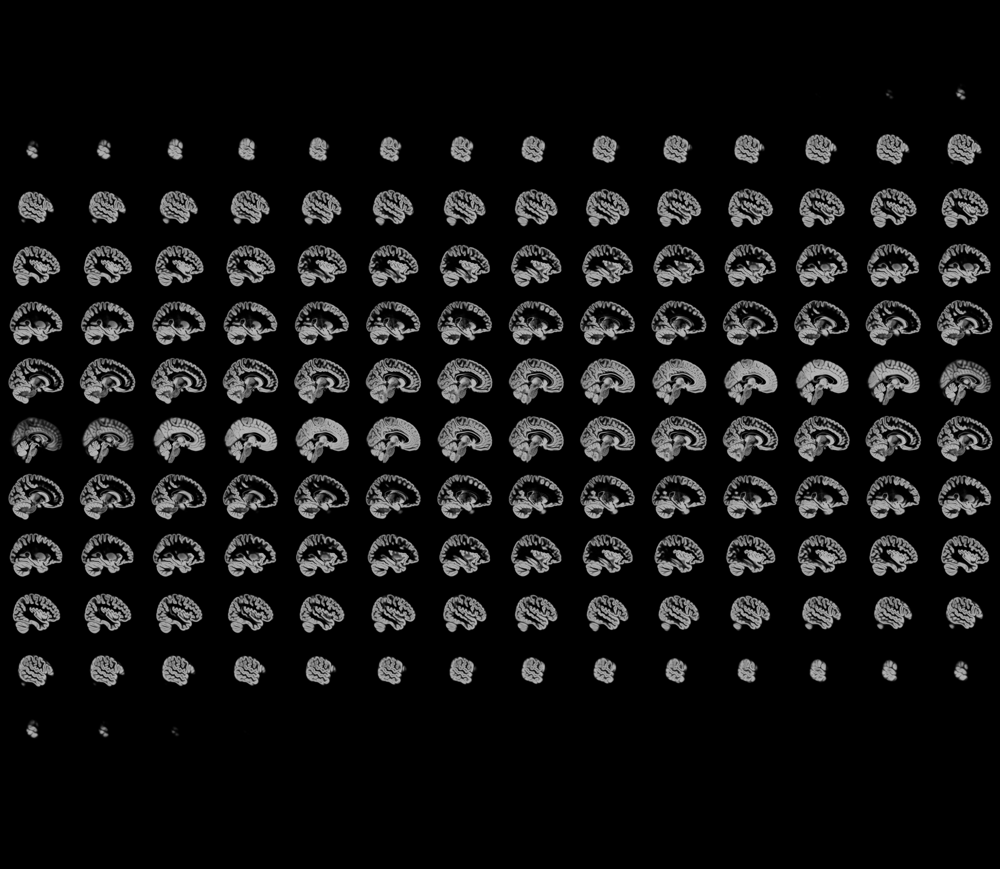
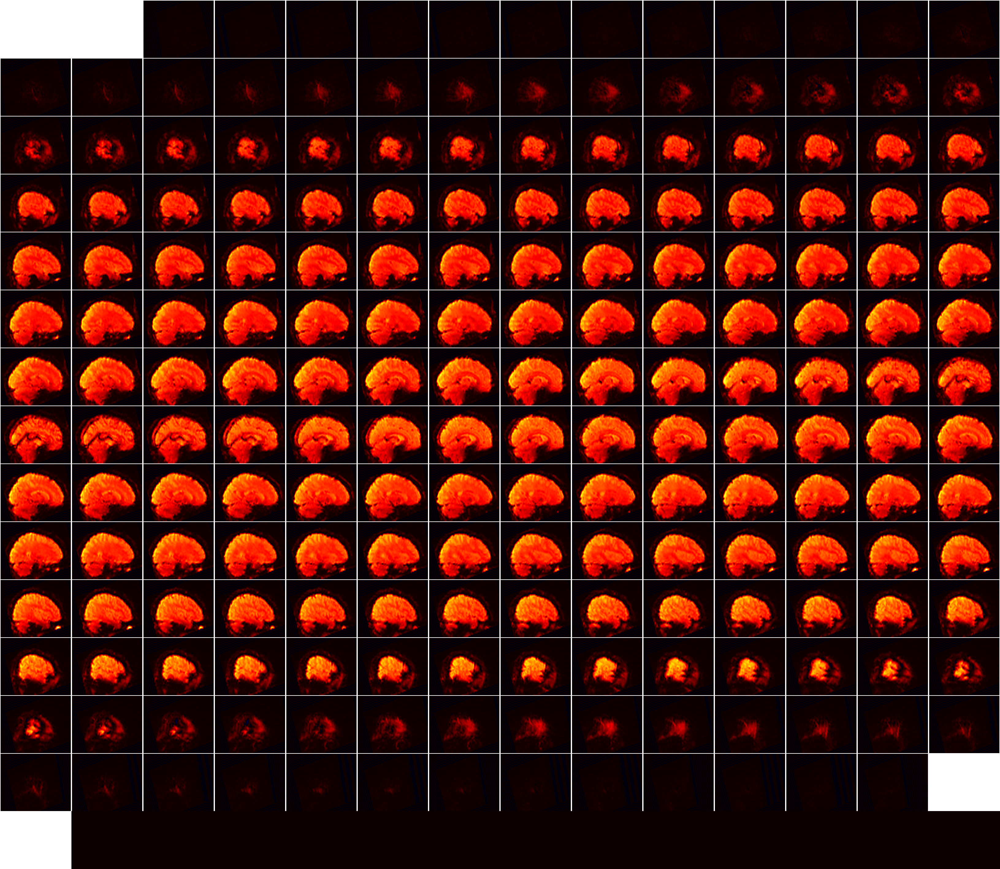

In [4]:
atlas = datasets.fetch_icbm152_2009()
plotting.view_img(img_1, threshold=None, opacity = 0.5, bg_img = atlas["gm"])


datasets.fetch_atlas_harvard_oxford # 69 rois

datasets.fetch_atlas_difumo

datasets.fetch_atlas_msdl # 39 roi, has labels

datasets.fetch_atlas_schaefer_2018 # no subcortical

datasets.fetch_atlas_aal

datasets.fetch_atlas_smith_2009 # 70 rois, does not have label

datasets.fetch_atlas_surf_destrieux # surface atlas

datasets.fetch_atlas_craddock_2012 # does not have label

datasets.fetch_atlas_talairach

datasets.fetch_atlas_yeo_2011 # no subcortical

datasets.fetch_atlas_juelich # no label, 69 regions

datasets.fetch_atlas_basc_multiscale_2015 # no labels


In [17]:
# Smith BM70 parcellation
smith_bm70 = datasets.fetch_atlas_smith_2009(resting=False, dimension=70)["map"]
'''
plotting.plot_prob_atlas(    
    smith_bm70,
    title="Smith2009 70 Brainmap (with colorbar)",
    colorbar=True,
    view_type ='filled_contours' # or continuous or contours
)
'''

'\nplotting.plot_prob_atlas(    \n    smith_bm70,\n    title="Smith2009 70 Brainmap (with colorbar)",\n    colorbar=True,\n    view_type =\'filled_contours\' # or continuous or contours\n)\n'

/srv/conda/envs/notebook/lib/python3.10/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


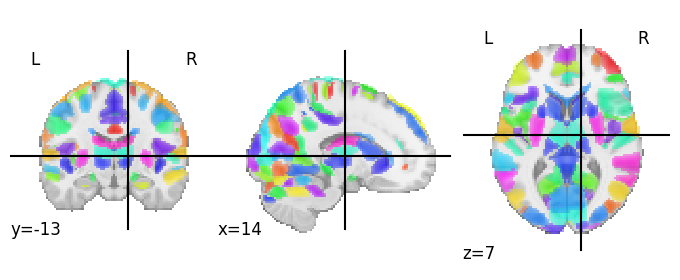

In [6]:
# DiFuMo
# Dictionaries of Functional Modes (“DiFuMo”) atlas
dim = 128
res = 2
difumo = datasets.fetch_atlas_difumo(
    dimension=dim, resolution_mm=res, legacy_format=False
)
plotting.plot_prob_atlas(difumo.maps, view_type ='continuous', cut_coords=(14,-13,7))

In [11]:
print(difumo.labels)

     component                                       difumo_names  \
0            1                    Middle frontal gyrus lateral LH   
1            2                      Middle frontal gyrus anterior   
2            3                           Superior occipital gyrus   
3            4                            Frontal pole lateral RH   
4            5  Superior precentral and postcentral sulci ante...   
..         ...                                                ...   
123        124                                  Putamen posterior   
124        125                           Postcentral gyrus middle   
125        126              Superior temporal sulcus posterior RH   
126        127                        Lateral ventricles superior   
127        128                                   Angular gyrus RH   

        yeo_networks7    yeo_networks17        gm        wm       csf  
0               ContA             ContB  0.624933  0.262957  0.091519  
1        SalVentAttnA      

In [33]:
from nilearn import maskers

masker = maskers.NiftiMapsMasker(
    difumo.maps, resampling_target="data",
    t_r=2, detrend=True,
    low_pass=0.1, high_pass=0.01).fit()
roi_time_series = masker.transform(img,confounds=confound_sel)
print(roi_time_series.shape)

(80, 128)


/srv/conda/envs/notebook/lib/python3.10/site-packages/joblib/memory.py:353: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  return self.func(*args, **kwargs)


In [26]:
difumo.labels.difumo_names

0                        Middle frontal gyrus lateral LH
1                          Middle frontal gyrus anterior
2                               Superior occipital gyrus
3                                Frontal pole lateral RH
4      Superior precentral and postcentral sulci ante...
                             ...                        
123                                    Putamen posterior
124                             Postcentral gyrus middle
125                Superior temporal sulcus posterior RH
126                          Lateral ventricles superior
127                                     Angular gyrus RH
Name: difumo_names, Length: 128, dtype: object

/srv/conda/envs/notebook/lib/python3.10/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


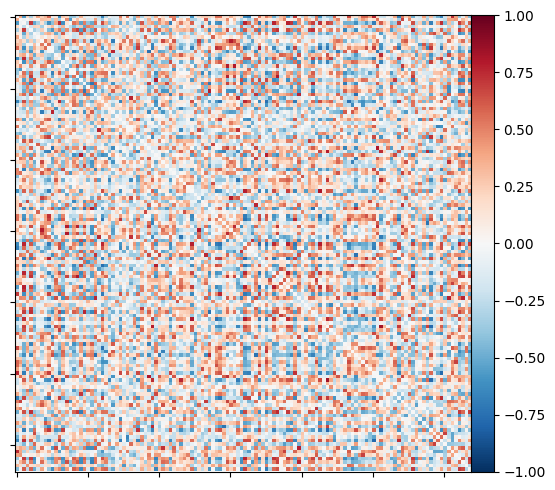

In [34]:
from nilearn.connectome import ConnectivityMeasure

correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]

np.fill_diagonal(correlation_matrix, 0)
plotting.plot_matrix(correlation_matrix,label = difumo.labels.difumo_names,
                     vmax=1, vmin=-1, colorbar=True)

In [36]:
from nilearn.plotting import find_probabilistic_atlas_cut_coords
cut_coords = find_probabilistic_atlas_cut_coords(difumo.maps)
plotting.view_connectome(correlation_matrix, cut_coords, edge_threshold="20%", edge_cmap='bwr',
                         symmetric_cmap=True, linewidth=6.0, node_size=3.0)


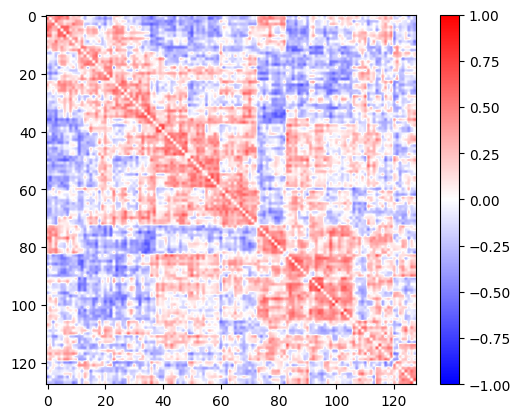

In [8]:
import numpy as np
from scipy.cluster import hierarchy
import matplotlib.pyplot as plt

# Example connectivity matrix (replace this with your actual matrix)
connectivity_matrix = correlation_matrix

# Calculate the linkage matrix using hierarchical clustering
linkage_matrix = hierarchy.linkage(connectivity_matrix, method='average')

# Reorder the matrix based on the hierarchical clustering
reordered_indices = hierarchy.leaves_list(linkage_matrix)

reordered_matrix = connectivity_matrix[reordered_indices][:, reordered_indices]

# Visualize the reordered matrix
plt.imshow(reordered_matrix, cmap='bwr', origin='upper', vmin=-1, vmax=1)
plt.colorbar()
plt.show()


In [5]:
correlation_vec_meas = ConnectivityMeasure(kind='correlation',vectorize=True)
correlation_vector = correlation_vec_meas.fit_transform([roi_time_series])[0]
correlation_vector.shape

/srv/conda/envs/notebook/lib/python3.10/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


(8256,)

In [11]:
# a clean version of everything
import nibabel as nib
import os
import numpy as np
from nilearn import image
from nilearn import plotting
from nilearn import datasets
from nilearn.connectome import ConnectivityMeasure
import pandas as pd
from nilearn import maskers

# load the data
datpath = '../shared/ds000030_R1.0.5/uncompressed/derivatives/fmriprep/'
subfolder = 'sub-10329'
task_list = ['bart','bht','scap','stopsignal'] # we need 4 tasks
task = task_list[1]
filename = subfolder + '_task-' + task + '_bold_space-MNI152NLin2009cAsym_preproc.nii.gz'
full_path = os.path.join(datpath, subfolder, 'func',filename)
img = nib.load(full_path)
# define confounds
confound_name = subfolder + '_task-' + task + '_bold_confounds.tsv'
confound_path = os.path.join(datpath, subfolder, 'func',confound_name)
confound_df = pd.read_csv(confound_path, sep='\t')
confound_list = ['WhiteMatter','GlobalSignal','X','Y','Z','RotX','RotY','RotZ']
confound_sel = confound_df[confound_list]

# DiFuMo
# Dictionaries of Functional Modes (“DiFuMo”) atlas
dim = 128
res = 2
difumo = datasets.fetch_atlas_difumo(
    dimension=dim, resolution_mm=res, legacy_format=False
)

# extract roi signals
masker = maskers.NiftiMapsMasker(
    difumo.maps, resampling_target="data",
    t_r=2, detrend=True,
    low_pass=0.1, high_pass=0.01).fit()
roi_time_series = masker.transform(img,confounds=confound_sel)
# calculate connectivity
# matrix form
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([roi_time_series])[0]
# this is the label of the parcellation
label_difumo =difumo.labels.difumo_names
# np.fill_diagonal(correlation_matrix, 0)

/srv/conda/envs/notebook/lib/python3.10/site-packages/joblib/memory.py:353: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  return self.func(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.10/site-packages/nilearn/connectome/connectivity_matrices.py:495: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  covariances_std = [


KeyError: 0

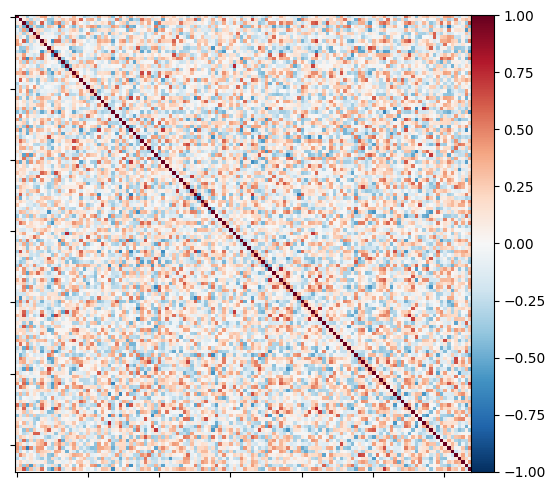

In [12]:
plotting.plot_matrix(correlation_matrix,label = difumo.labels.difumo_names,
                     vmax=1, vmin=-1, colorbar=True)

In [16]:
label_difumo =difumo.labels.difumo_names
print(label_difumo)

0                        Middle frontal gyrus lateral LH
1                          Middle frontal gyrus anterior
2                               Superior occipital gyrus
3                                Frontal pole lateral RH
4      Superior precentral and postcentral sulci ante...
                             ...                        
123                                    Putamen posterior
124                             Postcentral gyrus middle
125                Superior temporal sulcus posterior RH
126                          Lateral ventricles superior
127                                     Angular gyrus RH
Name: difumo_names, Length: 128, dtype: object
